## Libraries Used

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from glob import glob
import scipy.io as sio
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

In [2]:
import tensorflow as tf
import tensorflow.keras as keras
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
import tensorflow.keras.layers as L
from tensorflow.keras.optimizers import Adam
import tensorflow_probability as tfp

from tensorflow.keras.initializers import Constant
from tensorflow.keras.backend import sigmoid, relu

2024-06-17 13:02:47.415315: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-17 13:02:47.415419: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-17 13:02:47.530860: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Data Loader

In [3]:
def load_image(path, size, mask=False):
    if mask:
        # Load .mat file for masks
        mask_data = sio.loadmat(path)["inst_map"]  # Adjust the key according to your .mat file structure
        mask_data = cv2.resize(mask_data, (size, size), interpolation=cv2.INTER_NEAREST)
        mask_data = (mask_data > 0).astype('uint8') * 255
        mask_data = mask_data.astype('float32') / 255.0
        return mask_data
    else:
        # Load and resize image using OpenCV
        image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (size, size))
        image = image.astype('float32') / 255.0
        return image

def load_data(root_path, size):
    images = []
    masks = []

    image_folder = os.path.join(root_path, 'Images')
    mask_folder = os.path.join(root_path, 'Labels')

    for image_path in sorted(glob(os.path.join(image_folder, '*.png'))):
        img_id = os.path.basename(image_path).split('.')[0]
        mask_path = os.path.join(mask_folder, f'{img_id}.mat')

        img = load_image(image_path, size, mask=False)
        mask = load_image(mask_path, size, mask=True)

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

In [4]:
size = 256   # image size: 256x256
root_path = '/kaggle/input/tnbc-seg/CPM 17/cpm17/train'
X_train, y_train = load_data(root_path, size)

size = 256   # image size: 256x256
root_path = '/kaggle/input/tnbc-seg/CPM 17/cpm17/test'
X_test, y_test = load_data(root_path, size)

In [5]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=35)

print('X_train shape:',X_train.shape)
print('y_train shape:',y_train.shape)
print('X_val shape:',X_val.shape)
print('X_test shape:',X_test.shape)
print('y_test shape:',y_test.shape)

X_train shape: (25, 256, 256, 3)
y_train shape: (25, 256, 256)
X_val shape: (7, 256, 256, 3)
X_test shape: (32, 256, 256, 3)
y_test shape: (32, 256, 256)


In [6]:
def horizontal_flip(image, mask):
    flipped_image = np.fliplr(image)
    flipped_mask = np.fliplr(mask)
    return flipped_image, flipped_mask

def vertical_flip(image, mask):
    flipped_image = np.flipud(image)
    flipped_mask = np.flipud(mask)
    return flipped_image, flipped_mask

def rotate_90(image, mask):
    rotated_image = np.rot90(image)
    rotated_mask = np.rot90(mask)
    return rotated_image, rotated_mask

def rotate_270(image, mask):
    rotated_image = np.rot90(image, -1)
    rotated_mask = np.rot90(mask, -1)
    return rotated_image, rotated_mask

augmented_X_train = []
augmented_y_train = []

for i in range(len(X_train)):
    image = X_train[i]
    mask = y_train[i]
    
    augmented_X_train.append(image)
    augmented_y_train.append(mask)

    # Horizontal flip
    h_flip_image, h_flip_mask = horizontal_flip(image, mask)
    augmented_X_train.append(h_flip_image)
    augmented_y_train.append(h_flip_mask)

    # Vertical flip
    v_flip_image, v_flip_mask = vertical_flip(image, mask)
    augmented_X_train.append(v_flip_image)
    augmented_y_train.append(v_flip_mask)

    # Rotate 90 degrees
    rot_90_image, rot_90_mask = rotate_90(image, mask)
    augmented_X_train.append(rot_90_image)
    augmented_y_train.append(rot_90_mask)

    # Rotate 270 degrees
    rot_270_image, rot_270_mask = rotate_270(image, mask)
    augmented_X_train.append(rot_270_image)
    augmented_y_train.append(rot_270_mask)

augmented_X_train = np.array(augmented_X_train)
augmented_y_train = np.array(augmented_y_train)

print("Augmented X_train shape:", augmented_X_train.shape)
print("Augmented y_train shape:", augmented_y_train.shape)

Augmented X_train shape: (125, 256, 256, 3)
Augmented y_train shape: (125, 256, 256)


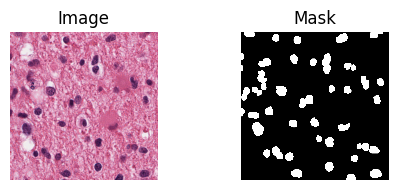

In [7]:
image = augmented_X_train[52]
mask = augmented_y_train[52]

fig, axes = plt.subplots(1, 2, figsize=(5, 2))
axes[0].imshow(image, cmap='gray')
axes[0].axis('off')
axes[0].set_title('Image')

axes[1].imshow(mask*255, cmap='gray', vmin=0, vmax=1)
axes[1].axis('off')
axes[1].set_title('Mask')

plt.tight_layout()
plt.show()

## Metrics and Losses

In [8]:
def dice_score(y_true, y_pred):
    smooth = K.epsilon()
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    score = (2. * intersection + smooth) / (K.sum(y_true_flat) + K.sum(y_pred_flat) + smooth)
    return score

def iou(y_true, y_pred):
    smooth = K.epsilon()
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred)
    intersection = K.sum(y_true_flat * y_pred_flat)
    union = K.sum(y_true_flat) + K.sum(y_pred_flat) - intersection + smooth
    iou = (intersection + smooth) / union
    return iou

def sensitivity(y_true, y_pred):
    smooth = K.epsilon()
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred_pos)
    tp = K.sum(y_true_flat * y_pred_flat)
    fn = K.sum(y_true_flat * (1 - y_pred_flat))
    recall = (tp + smooth) / (tp + fn + smooth)
    return recall

def specificity(y_true, y_pred):
    smooth = K.epsilon()
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred_pos)
    tn = K.sum((1 - y_true_flat) * (1 - y_pred_flat))
    fp = K.sum((1 - y_true_flat) * y_pred_flat)
    spec = (tn + smooth) / (tn + fp + smooth)
    return spec

def precision(y_true, y_pred):
    smooth = K.epsilon()
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))
    y_true_flat = K.flatten(K.cast(y_true, 'float32'))
    y_pred_flat = K.flatten(y_pred_pos)
    tp = K.sum(y_true_flat * y_pred_flat)
    fp = K.sum((1 - y_true_flat) * y_pred_flat)
    precision = (tp + smooth) / (tp + fp + smooth)
    return precision

In [9]:
def dice_loss(y_true, y_pred):
    loss = 1 - dice_score(y_true, y_pred)
    return loss

def iou_loss(y_true, y_pred):
    loss = 1 - iou(y_true, y_pred)
    return loss
    
def bce_loss(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=y_true, logits=y_pred))
    return loss

def combined_loss(y_true, y_pred):
    loss = dice_loss(y_true, y_pred) + iou_loss(y_true, y_pred)
    return loss

## Model

In [10]:
class ReLUActivation(Layer):
    def call(self, inputs):
        return relu(inputs)
    
class SigmoidActivation(Layer):
    def call(self, inputs):
        return tf.nn.sigmoid(inputs)

def CropAndMerge(Input1, Input2):
    def crop_and_merge(inputs):
        Input1, Input2 = inputs
        Size1_x, Size2_x = tf.shape(Input1)[1], tf.shape(Input2)[1]
        Size1_y, Size2_y = tf.shape(Input1)[2], tf.shape(Input2)[2]
        
        diff_x = (Size1_x - Size2_x) // 2
        diff_y = (Size1_y - Size2_y) // 2
        
        crop = Input1[:, diff_x:diff_x+Size2_x, diff_y:diff_y+Size2_y, :]
        concat = tf.concat([crop, Input2], axis=3)
        
        return concat
    
    return Lambda(crop_and_merge)([Input1, Input2])

def attention_gt(input_x, input_g, fil_las):
    fil_int = fil_las // 2

    input_g = Conv2D(filters=fil_las, kernel_size=(1, 1), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(input_g)
    theta_x = Conv2D(filters=fil_int, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(input_x)
    phi_g = Conv2D(filters=fil_int, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(input_g)
    phi_g_u = UpSampling2D(size=(2, 2), interpolation='bilinear')(phi_g)
    f = ReLUActivation()(Add()([theta_x, phi_g_u]))

    psi_f = Conv2D(filters=fil_las, kernel_size=(1, 1), activation='relu', padding='same')(f)
    psi_f = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.0), gamma_initializer=Constant(1.0), momentum=0.5)(psi_f)
    sigm_psi_f = SigmoidActivation()(psi_f)
    expand = Reshape(target_shape=input_x.shape[-3:])(sigm_psi_f)
    y = Multiply()([expand, input_x])

    return y

def conv_block(input, filters):
    x = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(input)
    x = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.0), gamma_initializer=Constant(1.0), momentum=0.5)(x)
    x = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(x)
    x = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.0), gamma_initializer=Constant(1.0), momentum=0.5)(x)
    return x

def bottleneck_block(input, filters):
    x = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(input)
    x = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.0), gamma_initializer=Constant(1.0), momentum=0.5)(x)
    x = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(x)
    x = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.0), gamma_initializer=Constant(1.0), momentum=0.5)(x)
    x = Conv2D(filters, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(x)
    x = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.0), gamma_initializer=Constant(1.0), momentum=0.5)(x)
    return x

def robust_residual_block(input, filters_inp):
    x1 = Conv2D(filters=filters_inp, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(input)
    x1 = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.01), gamma_initializer=Constant(1.0), momentum=0.5)(x1)
    x2 = SeparableConv2D(filters=filters_inp, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, depthwise_initializer='glorot_uniform', pointwise_initializer='glorot_uniform', bias_initializer=Constant(0.1), depth_multiplier=1)(x1)
    x2 = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.01), gamma_initializer=Constant(1.0), momentum=0.5)(x2)
    x3 = Conv2D(filters=filters_inp, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(x2)
    x3 = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.01), gamma_initializer=Constant(1.0), momentum=0.5)(x3)
    x = Concatenate()([input, x3])
    x = Conv2D(filters=filters_inp, kernel_size=(3, 3), activation='relu', padding='same', use_bias=True, kernel_initializer='glorot_normal', bias_initializer=Constant(0.1))(x)
    x = BatchNormalization(epsilon=1e-3, beta_initializer=Constant(0.01), gamma_initializer=Constant(1.0), momentum=0.5)(x)
    return x

def attention_decoder_block(input, filt, conc):
    atten_b = attention_gt(input_x=conc, input_g=input, fil_las=filt)
    x_ct = Conv2DTranspose(filters=filt, kernel_size=(2, 2), activation='relu', strides=(2, 2), padding='same', kernel_initializer='glorot_normal', bias_initializer=Constant(0.1), use_bias=True)(input)
    x = CropAndMerge(Input1=x_ct, Input2=atten_b)
    return x

def nuclei_segnet(input_shape, num_classes=1, output_activation='sigmoid'):
    inputs = Input(input_shape)
    filters = [32, 64, 128, 256, 512]

    x_conv1 = robust_residual_block(inputs, filters[0])
    x_pool1 = MaxPooling2D((2, 2), strides=(2, 2), padding="same")(x_conv1)
    x_conv2 = robust_residual_block(x_pool1, filters[1])
    x_pool2 = MaxPooling2D((2, 2), strides=(2, 2), padding="same")(x_conv2)
    x_conv3 = robust_residual_block(x_pool2, filters[2])
    x_pool3 = MaxPooling2D((2, 2), strides=(2, 2), padding="same")(x_conv3)
    x_conv4 = robust_residual_block(x_pool3, filters[3])
    x_pool4 = MaxPooling2D((2, 2), strides=(2, 2), padding="same")(x_conv4)
    x_conv5 = bottleneck_block(x_pool4, filters[4])

    x_tconv5 = attention_decoder_block(x_conv5, filters[3], x_conv4)
    u_conv4 = conv_block(x_tconv5, filters[3])
    x_tconv4 = attention_decoder_block(u_conv4, filters[2], x_conv3)
    u_conv3 = conv_block(x_tconv4, filters[2])
    x_tconv3 = attention_decoder_block(u_conv3, filters[1], x_conv2)
    u_conv2 = conv_block(x_tconv3, filters[1])
    x_tconv2 = attention_decoder_block(u_conv2, filters[0], x_conv1)
    u_conv1 = conv_block(x_tconv2, filters[0])

    outputs = Conv2D(num_classes, (1, 1), padding='same', activation=output_activation)(u_conv1)

    model = Model(inputs=[inputs], outputs=[outputs])

    return model


input_shape = (256, 256, 3)
model = nuclei_segnet(input_shape, num_classes=1, output_activation='sigmoid')
optimizer = Adam(learning_rate=0.0001)
model.compile(loss=combined_loss, metrics=["accuracy", dice_score, sensitivity, specificity, iou], optimizer=optimizer)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d    │ (None, 256, 256,  │      1,344 │ batch_normalizat… │
│ (SeparableConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ separable_conv2d… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 256, 256,  │          0 │ input_layer[0][0… │
│ (Concatenate)       │ 35)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     10,112 │ concatenate[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv2d_1  │ (None, 128, 128,  │      4,736 │ batch_normalizat… │
│ (SeparableConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ separable_conv2d… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_4[0][0]  

 Total params: 12,405,505 (47.32 MB)

 Trainable params: 12,395,713 (47.29 MB)

 Non-trainable params: 9,792 (38.25 KB)

## Training

In [11]:
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath='/kaggle/working/model.weights.h5',
    monitor='val_dice_score',
    save_best_only=True,
    save_weights_only=True,
    mode='max',
    verbose=1
    )

history = model.fit(augmented_X_train, augmented_y_train,
                    epochs = 100,
                    batch_size = 4,
                    validation_data = (X_val,y_val),
                    verbose = 1,
                    callbacks=[model_checkpoint_callback],
                    shuffle = True)

Epoch 1/100


2024-06-17 13:03:31.075828: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.35047, expected 2.80959
2024-06-17 13:03:31.075886: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 3.81961, expected 3.27872
2024-06-17 13:03:31.075900: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 4.35367, expected 3.81278
2024-06-17 13:03:31.075917: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 21: 3.87151, expected 3.33062
2024-06-17 13:03:31.075932: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 30: 4.11246, expected 3.57157
2024-06-17 13:03:31.075943: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 31: 4.24547, expected 3.70459
2024-06-17 13:03:31.075953: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32: 3.83231, expected 3.29143
2024-06-17 13:03:31.075964: E external/local_xla/xl

 1/32 ━━━━━━━━━━━━━━━━━━━━ 30:01 58s/step - accuracy: 0.5414 - dice_score: 0.3863 - iou: 0.2394 - loss: 1.3743 - sensitivity: 0.6197 - specificity: 0.5147

I0000 00:00:1718629442.032309     109 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


31/32 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.6652 - dice_score: 0.4809 - iou: 0.3206 - loss: 1.1985 - sensitivity: 0.7916 - specificity: 0.6300

2024-06-17 13:04:08.577601: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65536: 3.21834, expected 2.7814
2024-06-17 13:04:08.577660: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65568: 3.26727, expected 2.83033
2024-06-17 13:04:08.577670: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65715: 3.18355, expected 2.74662
2024-06-17 13:04:08.579199: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 393216: 3.19018, expected 2.45051
2024-06-17 13:04:08.579243: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 393217: 5.27948, expected 4.5398
2024-06-17 13:04:08.579252: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 393218: 5.16353, expected 4.42385
2024-06-17 13:04:08.579259: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 393219: 5.87278, expected 5.1331
2024-06-17 13:04:08.579268

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 886ms/step - accuracy: 0.6673 - dice_score: 0.4825 - iou: 0.3221 - loss: 1.1952 - sensitivity: 0.7937 - specificity: 0.6322

2024-06-17 13:04:34.191241: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 2.77172, expected 2.3641
2024-06-17 13:04:34.191588: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65536: 3.67853, expected 2.88927
2024-06-17 13:04:34.191630: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65537: 3.96403, expected 3.17477
2024-06-17 13:04:34.191647: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65538: 4.8455, expected 4.05624
2024-06-17 13:04:34.191660: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65539: 5.69452, expected 4.90526
2024-06-17 13:04:34.191670: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65540: 5.95949, expected 5.17023
2024-06-17 13:04:34.191678: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 65541: 5.91631, expected 5.12705
2024-06-17 13:04:34.191685: E ext


Epoch 1: val_dice_score improved from -inf to 0.49454, saving model to /kaggle/working/model.weights.h5
32/32 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 0.6693 - dice_score: 0.4840 - iou: 0.3234 - loss: 1.1922 - sensitivity: 0.7957 - specificity: 0.6344 - val_accuracy: 0.6808 - val_dice_score: 0.4945 - val_iou: 0.3333 - val_loss: 1.1479 - val_sensitivity: 0.9815 - val_specificity: 0.6099
Epoch 2/100
31/32 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8353 - dice_score: 0.6393 - iou: 0.4725 - loss: 0.8882 - sensitivity: 0.8900 - specificity: 0.8208
Epoch 2: val_dice_score improved from 0.49454 to 0.74900, saving model to /kaggle/working/model.weights.h5
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.8358 - dice_score: 0.6400 - iou: 0.4732 - loss: 0.8871 - sensitivity: 0.8899 - specificity: 0.8216 - val_accuracy: 0.9216 - val_dice_score: 0.7490 - val_iou: 0.5988 - val_loss: 0.6499 - val_sensitivity: 0.8449 - val_specificity: 0.9407
Epoch 3/100
31/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8

## Testing

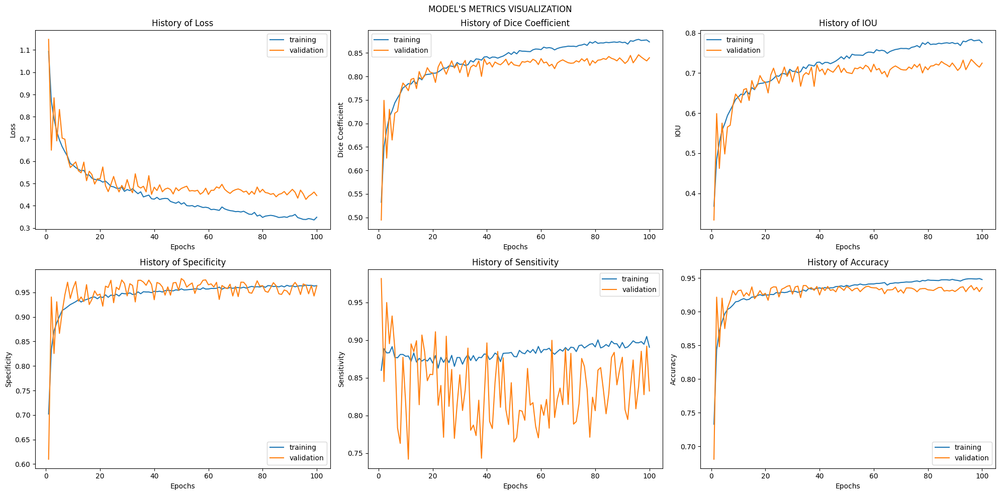

In [12]:
def Train_Val_Plot(loss, val_loss, dice_score, val_dice_score, iou, val_iou, specificity, val_specificity, sensitivity, val_sensitivity, accuracy, val_accuracy):
    fig, axs = plt.subplots(2, 3, figsize=(20, 10))
    fig.suptitle("MODEL'S METRICS VISUALIZATION")

    # Loss plot
    axs[0, 0].plot(range(1, len(loss) + 1), loss)
    axs[0, 0].plot(range(1, len(val_loss) + 1), val_loss)
    axs[0, 0].set_title('History of Loss')
    axs[0, 0].set_xlabel('Epochs')
    axs[0, 0].set_ylabel('Loss')
    axs[0, 0].legend(['training', 'validation'])

    # Dice Coefficient plot
    axs[0, 1].plot(range(1, len(dice_score) + 1), dice_score)
    axs[0, 1].plot(range(1, len(val_dice_score) + 1), val_dice_score)
    axs[0, 1].set_title('History of Dice Coefficient')
    axs[0, 1].set_xlabel('Epochs')
    axs[0, 1].set_ylabel('Dice Coefficient')
    axs[0, 1].legend(['training', 'validation'])

    # Mean IOU plot
    axs[0, 2].plot(range(1, len(iou) + 1), iou)
    axs[0, 2].plot(range(1, len(val_iou) + 1), val_iou)
    axs[0, 2].set_title('History of IOU')
    axs[0, 2].set_xlabel('Epochs')
    axs[0, 2].set_ylabel('IOU')
    axs[0, 2].legend(['training', 'validation'])

    # Recall plot
    axs[1, 0].plot(range(1, len(specificity) + 1), specificity)
    axs[1, 0].plot(range(1, len(val_specificity) + 1), val_specificity)
    axs[1, 0].set_title('History of Specificity')
    axs[1, 0].set_xlabel('Epochs')
    axs[1, 0].set_ylabel('Specificity')
    axs[1, 0].legend(['training', 'validation'])

    # Precision plot
    axs[1, 1].plot(range(1, len(sensitivity) + 1), sensitivity)
    axs[1, 1].plot(range(1, len(val_sensitivity) + 1), val_sensitivity)
    axs[1, 1].set_title('History of Sensitivity')
    axs[1, 1].set_xlabel('Epochs')
    axs[1, 1].set_ylabel('Sensitivity')
    axs[1, 1].legend(['training', 'validation'])

    # Accuracy plot
    axs[1, 2].plot(range(1, len(accuracy) + 1), accuracy)
    axs[1, 2].plot(range(1, len(val_accuracy) + 1), val_accuracy)
    axs[1, 2].set_title('History of Accuracy')
    axs[1, 2].set_xlabel('Epochs')
    axs[1, 2].set_ylabel('Accuracy')
    axs[1, 2].legend(['training', 'validation'])

    plt.tight_layout()
    plt.show()

Train_Val_Plot(
    history.history['loss'], history.history['val_loss'],
    history.history['dice_score'], history.history['val_dice_score'],
    history.history['iou'], history.history['val_iou'],
    history.history['specificity'], history.history['val_specificity'],
    history.history['sensitivity'], history.history['val_sensitivity'],
    history.history['accuracy'], history.history['val_accuracy']
)

## Testing

In [13]:
model.load_weights("/kaggle/working/model.weights.h5")
model.evaluate(X_test, y_test, batch_size = 4, verbose = 1)

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.9385 - dice_score: 0.8359 - iou: 0.7188 - loss: 0.4453 - sensitivity: 0.8517 - specificity: 0.9600


[0.44336140155792236,
 0.9372386932373047,
 0.8366823792457581,
 0.839928150177002,
 0.9623312950134277,
 0.71995609998703]

In [14]:
modeller = Model(inputs=model.input, outputs=[model.get_layer(name="conv2d_17").output,model.layers[-2].output])

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Feature Distance (Foreground vs. Background): [0.4617686] || Pixel Distance (Foreground vs. Background): [1.2806423]
Dice: 0.8636712431907654 || Accuracy: 0.9485015869140625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Feature Distance (Foreground vs. Background): [0.4685955] || Pixel Distance (Foreground vs. Background): [1.1652194]
Dice: 0.8094069361686707 || Accuracy: 0.9332427978515625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_pca.py:642: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


Feature Distance (Foreground vs. Background): [0.54880875] || Pixel Distance (Foreground vs. Background): [1.0945941]
Dice: 0.7745543718338013 || Accuracy: 0.9496307373046875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.57346606] || Pixel Distance (Foreground vs. Background): [1.0362873]
Dice: 0.850165605545044 || Accuracy: 0.9235687255859375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.6098339] || Pixel Distance (Foreground vs. Background): [1.0450588]
Dice: 0.8892873525619507 || Accuracy: 0.950103759765625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.39490202] || Pixel Distance (Foreground vs. Background): [1.085903]
Dice: 0.8353257775306702 || Accuracy: 0.9759063720703125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_pca.py:642: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


Feature Distance (Foreground vs. Background): [0.49498853] || Pixel Distance (Foreground vs. Background): [1.0543294]
Dice: 0.8349677920341492 || Accuracy: 0.9696502685546875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.64401156] || Pixel Distance (Foreground vs. Background): [1.2328447]
Dice: 0.8384150862693787 || Accuracy: 0.912628173828125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.5517137] || Pixel Distance (Foreground vs. Background): [0.7652857]
Dice: 0.8220815658569336 || Accuracy: 0.9532012939453125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.53722566] || Pixel Distance (Foreground vs. Background): [0.87093383]
Dice: 0.8699820041656494 || Accuracy: 0.935089111328125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/ste

/opt/conda/lib/python3.10/site-packages/sklearn/decomposition/_pca.py:642: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


Feature Distance (Foreground vs. Background): [0.46732378] || Pixel Distance (Foreground vs. Background): [1.1829873]
Dice: 0.7367346286773682 || Accuracy: 0.945098876953125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Feature Distance (Foreground vs. Background): [0.57567316] || Pixel Distance (Foreground vs. Background): [1.1292224]
Dice: 0.8283693194389343 || Accuracy: 0.9019317626953125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Feature Distance (Foreground vs. Background): [0.5031658] || Pixel Distance (Foreground vs. Background): [1.13036]
Dice: 0.822534441947937 || Accuracy: 0.9311370849609375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.5603337] || Pixel Distance (Foreground vs. Background): [0.97171366]
Dice: 0.791202187538147 || Accuracy: 0.89886474609375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


/tmp/ipykernel_34/1448502135.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 5, figsize=(20, 4))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.45936152] || Pixel Distance (Foreground vs. Background): [1.0772089]
Dice: 0.865356981754303 || Accuracy: 0.982666015625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Feature Distance (Foreground vs. Background): [0.812983] || Pixel Distance (Foreground vs. Background): [1.1866032]
Dice: 0.8733546137809753 || Accuracy: 0.9384307861328125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.75213164] || Pixel Distance (Foreground vs. Background): [1.3556489]
Dice: 0.8196275234222412 || Accuracy: 0.925323486328125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Feature Distance (Foreground vs. Background): [0.5886963] || Pixel Distance (Foreground vs. Background): [1.1620606]
Dice: 0.8611641526222229 || Accuracy: 0.9544677734375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━

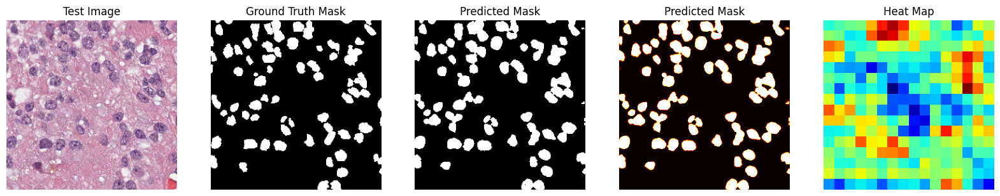

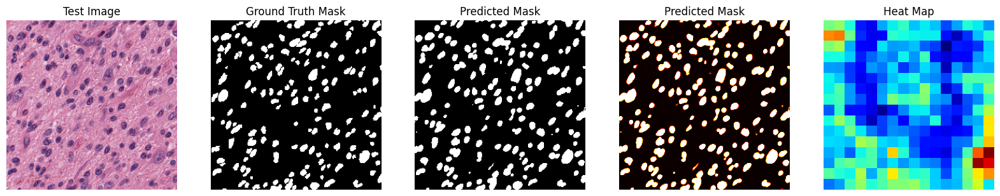

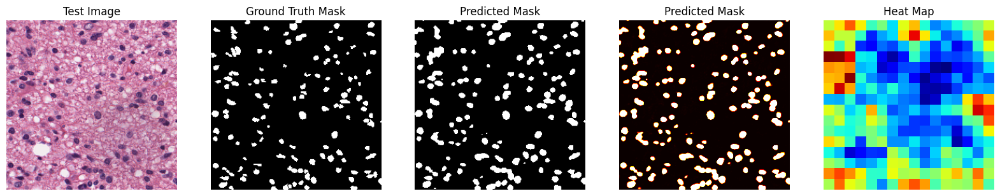

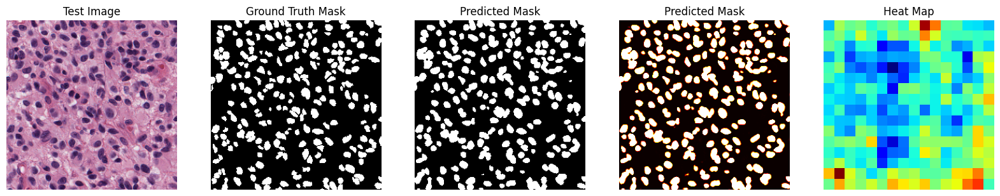

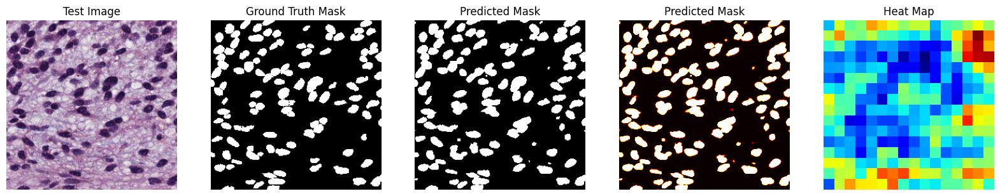

...

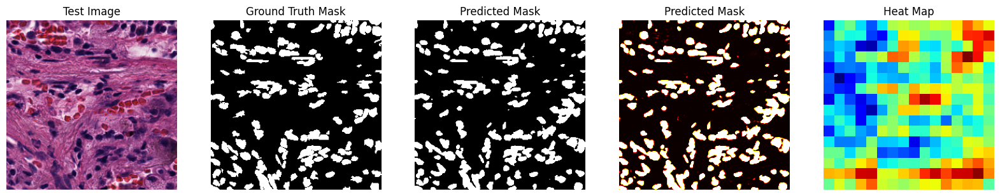

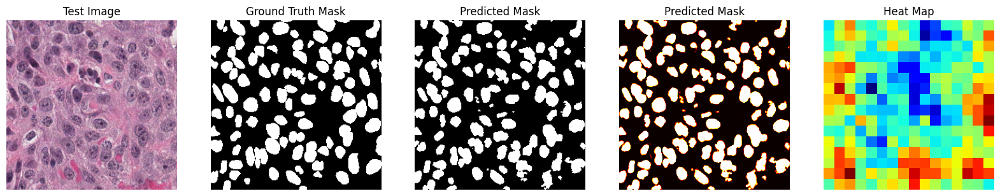

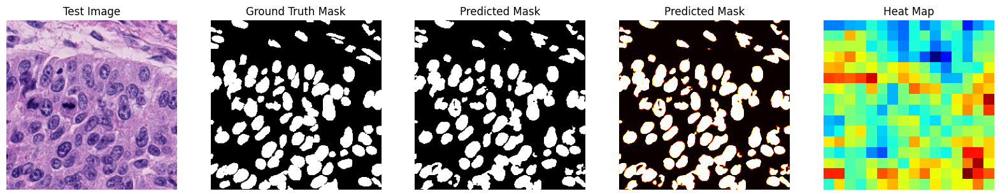

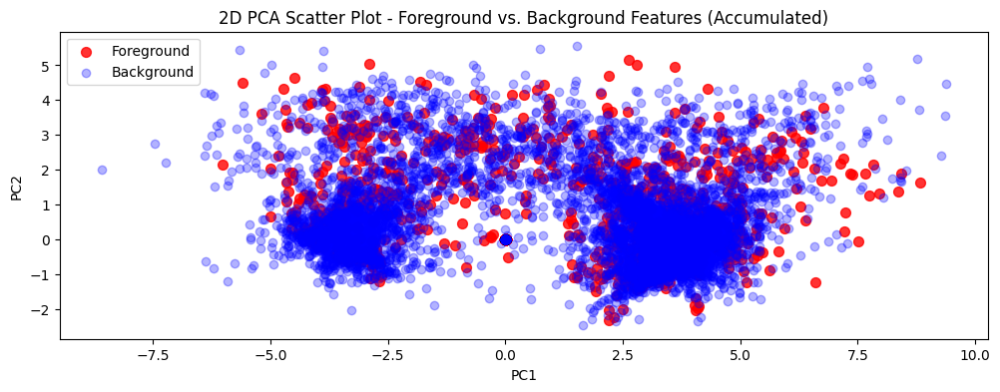

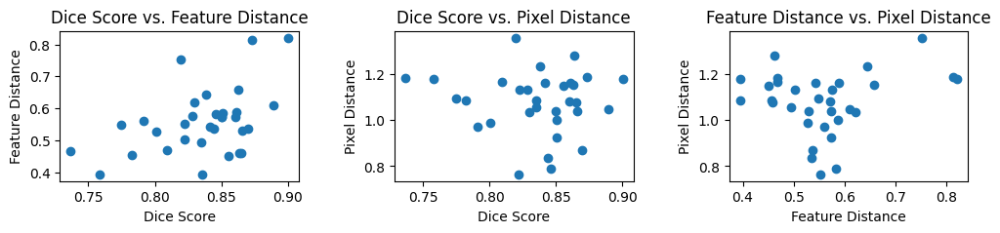

In [15]:
def extract_features(feature_map, mask):
    mask = tf.expand_dims(mask, axis=-1)
    fg_indices = tf.where(mask == 1)
    fg_feature = tf.gather_nd(feature_map, fg_indices)
    bg_indices = tf.where(mask == 0)
    bg_feature = tf.gather_nd(feature_map, bg_indices)
    return fg_feature, bg_feature

dice_scores = []
sim_scores = []
pix_scores = []
fg_features = []
bg_features = []

for z in range(0,32):
    test_image = X_test[z]  
    test_mask = y_test[z] 

    test_image = np.reshape(test_image, (1,) + test_image.shape)

    predicted_mask = model.predict(test_image)[0]
    heat_map, feat_map = modeller.predict(test_image)
    loss, acc, dice, sen, spe, iou = model.evaluate(test_image, tf.expand_dims(test_mask, axis=0), verbose = 0)
    dice_scores.append(dice)
    predicted_mask_binary = np.where(predicted_mask > 0.5, 1, 0) * 255
    
    fg_feat_map, bg_feat_map = extract_features(feat_map, test_mask)
    
    fg_pca = PCA(n_components=2)
    fg_pca.fit(fg_feat_map)
    fg_feature = tf.convert_to_tensor(fg_pca.transform(fg_feat_map.numpy()))
    fg_features.append(fg_feature.numpy())
    bg_pca = PCA(n_components=2)
    bg_pca.fit(bg_feat_map.numpy())
    bg_feature = tf.convert_to_tensor(bg_pca.transform(bg_feat_map.numpy()))
    bg_features.append(bg_feature.numpy())
    
    fg_feat_map = tf.math.reduce_mean(feat_map, axis=-1, keepdims=True)[tf.expand_dims(test_mask, axis=0) == 1]  # foreground (GT 1)
    bg_feat_map = tf.math.reduce_mean(feat_map, axis=-1, keepdims=True)[tf.expand_dims(test_mask, axis=0) == 0]  # background (GT 0)
    fg_feat_map = Dense(2000)(tf.expand_dims(fg_feat_map, axis=0))
    bg_feat_map = Dense(2000)(tf.expand_dims(bg_feat_map, axis=0))
    fg_feat_map = tf.math.reduce_mean(fg_feat_map, axis=1)
    bg_feat_map = tf.math.reduce_mean(bg_feat_map, axis=1)
    
    fg_pixel = tf.math.reduce_mean(test_image, axis=-1, keepdims=True)[tf.expand_dims(test_mask, axis=0) == 1]  # foreground (GT 1)
    bg_pixel = tf.math.reduce_mean(test_image, axis=-1, keepdims=True)[tf.expand_dims(test_mask, axis=0) == 0]  # background (GT 0)
    fg_pixel = Dense(2000)(tf.expand_dims(fg_pixel, axis=0))
    bg_pixel = Dense(2000)(tf.expand_dims(bg_pixel, axis=0))
    fg_pixel = tf.math.reduce_mean(fg_pixel, axis=1)
    bg_pixel = tf.math.reduce_mean(bg_pixel, axis=1)
    
    similarity = tf.norm(fg_feat_map - bg_feat_map, ord=2, axis=-1)
    sim_scores.append(similarity[0])
    
    pix = tf.norm(fg_pixel - bg_pixel, ord=2, axis=-1)
    pix_scores.append(pix[0])

    print("Feature Distance (Foreground vs. Background):", similarity.numpy(), "|| Pixel Distance (Foreground vs. Background):", pix.numpy())
    
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))

    # Plot the test image
    axes[0].imshow(test_image[0], cmap='gray')
    axes[0].set_title('Test Image')
    axes[0].axis('off')

    # Plot the ground truth mask
    axes[1].imshow(test_mask, cmap='gray')
    axes[1].set_title('Ground Truth Mask')
    axes[1].axis('off')
    
    # Plot the binarized predicted mask
    axes[2].imshow(predicted_mask_binary, cmap='gray')
    axes[2].set_title('Predicted Mask')
    axes[2].axis('off')

    # Plot the soft predicted mask
    axes[3].imshow(predicted_mask*255, cmap='hot')
    axes[3].set_title('Predicted Mask')
    axes[3].axis('off')
    
    # Plot the predicted mask
    axes[4].imshow(tf.math.reduce_mean(tf.math.reduce_mean(heat_map, axis=-1), axis=0), cmap='jet')
    axes[4].set_title('Heat Map')
    axes[4].axis('off')
    
    print("Dice:", dice, "|| Accuracy:", acc) 
    
fg_features_all = np.concatenate(fg_features, axis=0)
bg_features_all = np.concatenate(bg_features, axis=0)

plt.figure(figsize=(12, 4))
plt.scatter(fg_features_all[:, 0], fg_features_all[:, 1], c='red', label='Foreground', s=50, alpha=0.8)
plt.scatter(bg_features_all[:, 0], bg_features_all[:, 1], c='blue', label='Background', alpha=0.3)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('2D PCA Scatter Plot - Foreground vs. Background Features (Accumulated)')
plt.legend()
plt.show()
    
fig, axes = plt.subplots(1, 3, figsize=(12, 2))  
plt.subplots_adjust(wspace=0.4) 

axes[0].scatter(dice_scores, sim_scores)
axes[0].set_xlabel('Dice Score')
axes[0].set_ylabel('Feature Distance')
axes[0].set_title('Dice Score vs. Feature Distance')

axes[1].scatter(dice_scores, pix_scores)
axes[1].set_xlabel('Dice Score')
axes[1].set_ylabel('Pixel Distance')
axes[1].set_title('Dice Score vs. Pixel Distance')

axes[2].scatter(sim_scores, pix_scores)
axes[2].set_xlabel('Feature Distance')
axes[2].set_ylabel('Pixel Distance')
axes[2].set_title('Feature Distance vs. Pixel Distance')

plt.show()